# Segmentation Analysis

## Load Packages

In [1]:
# Import packages
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib as m
import matplotlib.pyplot as plt

# Machine Learning

from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

plt.style.use('ggplot')
plt.figure(1 , figsize = (15 , 6))
%matplotlib inline

## Load dataset and explore the data

In [2]:
# Load dataset
df = pd.read_csv('Input/dataset.csv')
print('Dataset contains {} rows and {} columns'.format(df.shape[0],df.shape[1]))
df.head().append(df.tail())

Dataset contains 260645 rows and 7 columns


,transaction_id,order_datetime,location,item_name,item_amount,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,beverage,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,dessert,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salad,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,dessert,1,41.884490,-87.627059
260640,0x75ab27,2019-04-03 11:31:00,5,dessert,1,41.881818,-87.640234
260641,0x560060,2019-08-09 00:23:00,6,pizza,2,41.784576,-87.607565
260642,0x560060,2019-08-09 00:23:00,6,dessert,2,41.784576,-87.607565
260643,0x132dce,2019-08-22 13:41:00,7,salad,1,41.794132,-88.010140
260644,0x132dce,2019-08-22 13:41:00,7,dessert,1,41.794132,-88.010140


In [3]:
# Check the data types loaded into our datafram
df.dtypes

transaction_id     object
order_datetime     object
location            int64
item_name          object
item_amount         int64
latitude          float64
longitude         float64
dtype: object

In [4]:
# Converting order_datetime from objject to datetime
df['order_datetime'] = pd.to_datetime(df['order_datetime'])

In [5]:
# Getting a overview on the variables we have
df.describe()

,location,item_amount,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


In [6]:
# Quick check to know whether we have any missing values
df.isnull().sum()

transaction_id    0
order_datetime    0
location          0
item_name         0
item_amount       0
latitude          0
longitude         0
dtype: int64

In [7]:
# Reshaping the dataset to details by transaction
df = df.pivot(index =['transaction_id','order_datetime','location'], columns = 'item_name', values='item_amount')

In [8]:
df.reset_index(drop=False, inplace=True)

In [9]:
# Creating a few features related to the moment the order was made
df['day'] = df['order_datetime'].dt.day
df['month'] = df['order_datetime'].dt.month
df['year'] = df['order_datetime'].dt.year
df['weekday'] = df['order_datetime'].dt.weekday
df['weekend'] = (df['order_datetime'].dt.weekday>4).astype(int)
df['time'] = df['order_datetime'].dt.time

In [10]:
df.fillna(0,inplace=True)

## Visualization

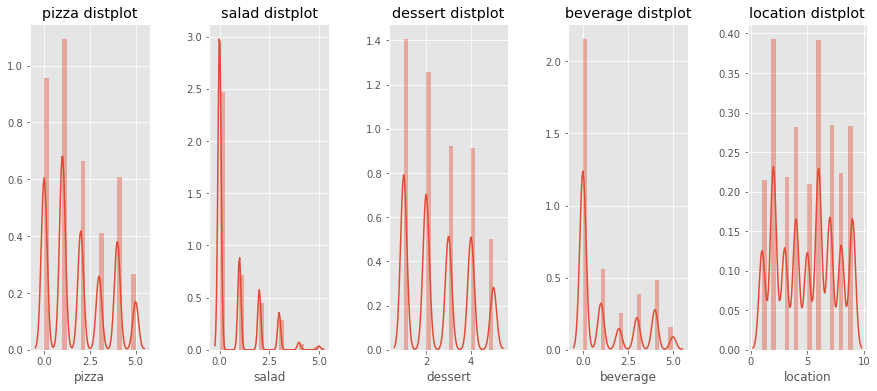

In [11]:
# Plot
plt.figure(1 , figsize = (15 , 6))
n = 0 

for x in ['pizza' , 'salad' , 'dessert', 'beverage', 'location']:
    n += 1
    plt.subplot(1 , 5 , n)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.distplot(df[x] , bins = 20)
    plt.title('{} distplot'.format(x))
plt.show()

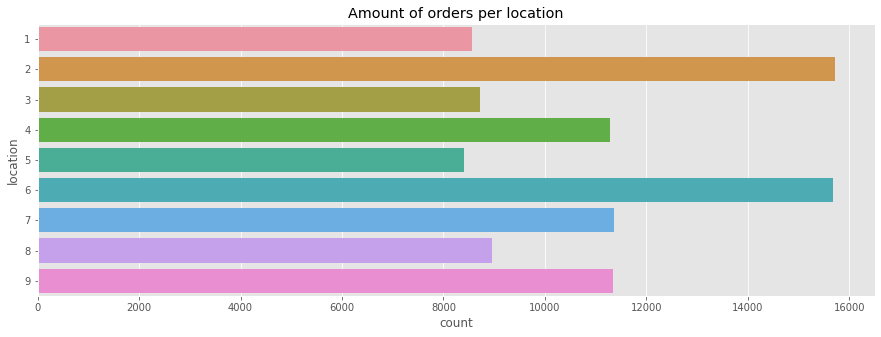

In [12]:
# Plot
plt.figure(1 , figsize = (15 , 5))
sns.countplot(y = 'location' , data = df)
plt.title('Amount of orders per location')
plt.show()

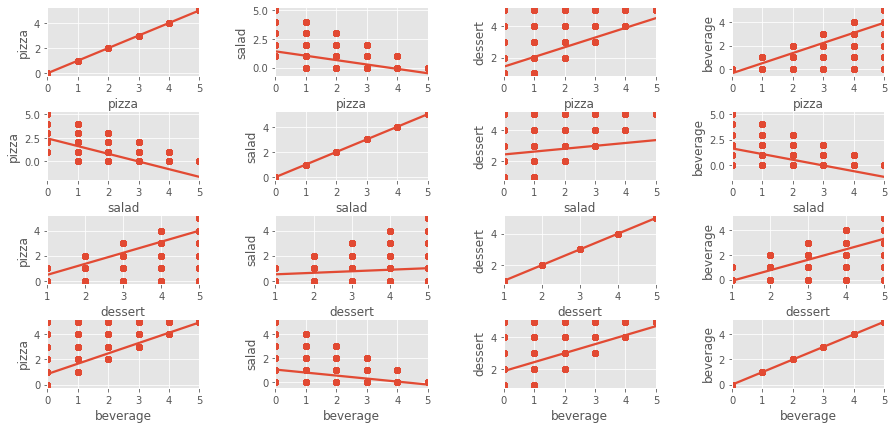

In [13]:
# Relationship between products

plt.figure(1 , figsize = (15 , 7))
n = 0 

product = ['pizza', 'salad','dessert','beverage']

for x in product:
    for y in product:
        n += 1
        plt.subplot(4 , 4 , n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
        sns.regplot(x = x , y = y , data = df)
        plt.ylabel(y)
plt.show()

## Cluster analysis

### Segmentation 1

In [14]:
C1 = df[['pizza','dessert']].to_numpy()

wcss_c1 = []

# Let's test different number of k
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    model.fit(C1)
    wcss_c1.append(model.inertia_)

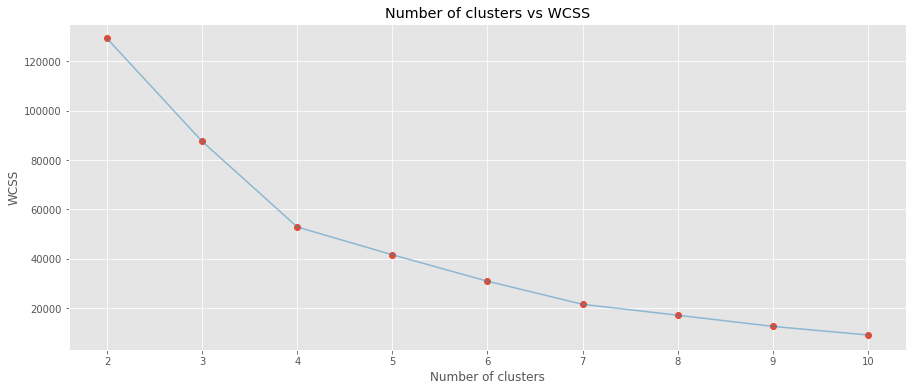

In [15]:
# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_c1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_c1 , '-' , alpha = 0.5)
plt.xlabel('Number of clusters') , plt.ylabel('WCSS')
plt.title('Number of clusters vs WCSS')
plt.show()

#### Segmentation using 2 clusters

In [16]:
# model
model_seg1 = KMeans(n_clusters = 2, 
                     init = 'k-means++', 
                     n_init = 10, 
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan')
model_seg1.fit(C1)
labels1 = model_seg1.labels_
centroids1 = model_seg1.cluster_centers_

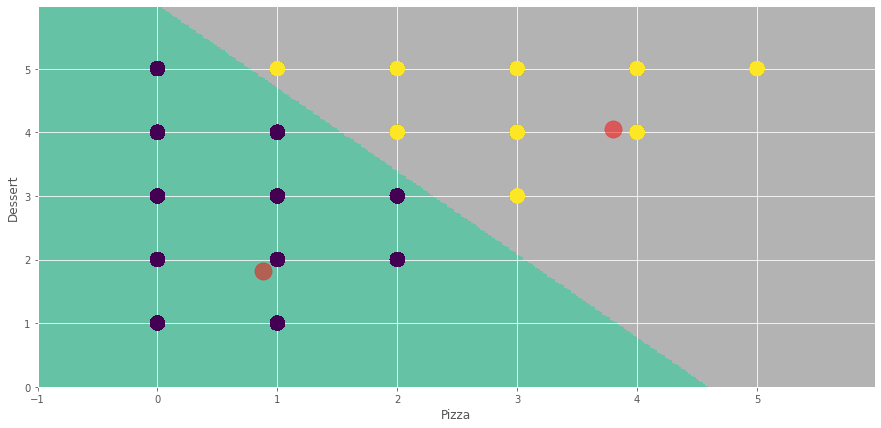

In [17]:
# Plot

# Meshgrid Parameters
h = 0.02
x_min, x_max = C1[:, 0].min() - 1, C1[:, 0].max() + 1
y_min, y_max = C1[:, 1].min() - 1, C1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg1.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot 
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot data points
plt.scatter( x = 'pizza', y = 'dessert', data = df, c = labels1, s = 200 )
plt.scatter(x = centroids1[: , 0], y =  centroids1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Dessert')
plt.show()

### Segmentation 2

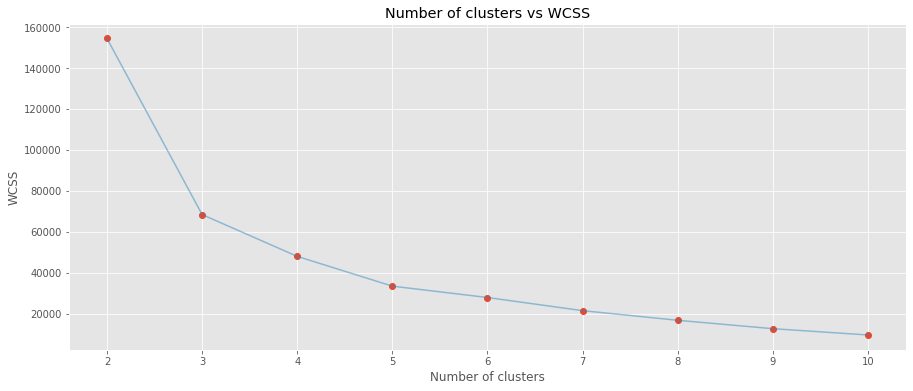

In [18]:
C1 = df[['pizza','salad']].to_numpy()

wcss_c1 = []
# Let's test different number of k
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    model.fit(C1)
    wcss_c1.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_c1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_c1 , '-' , alpha = 0.5)
plt.xlabel('Number of clusters') , plt.ylabel('WCSS')
plt.title('Number of clusters vs WCSS')
plt.show()

In [19]:
model_seg2 = (KMeans(n_clusters = 3,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

model_seg2.fit(C1)
labels2 = model_seg2.labels_
centroids2 = model_seg2.cluster_centers_

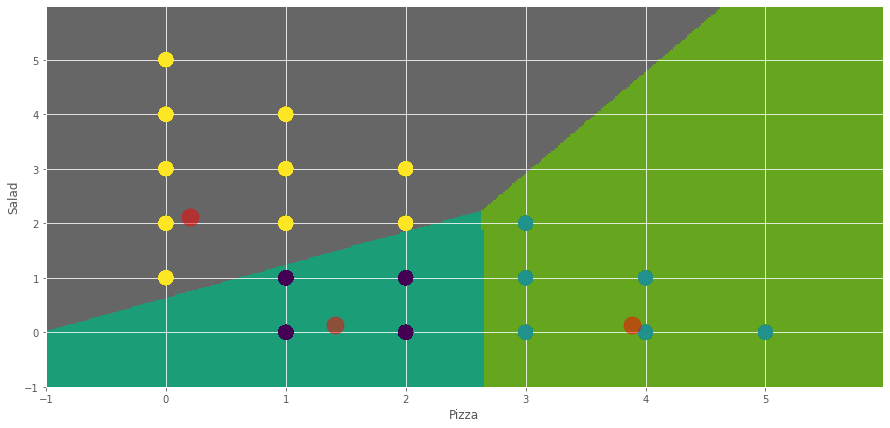

In [20]:
# Plot

# Meshgrid
h = 0.02
x_min, x_max = C1[:, 0].min() - 1, C1[:, 0].max() + 1
y_min, y_max = C1[:, 1].min() - 1, C1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg2.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Dark2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot 
plt.scatter( x = 'pizza', y = 'salad', data = df, c = labels2, s = 200 )
plt.scatter(x = centroids2[: , 0], y =  centroids2[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salad')
plt.show()

### Segmentation 3

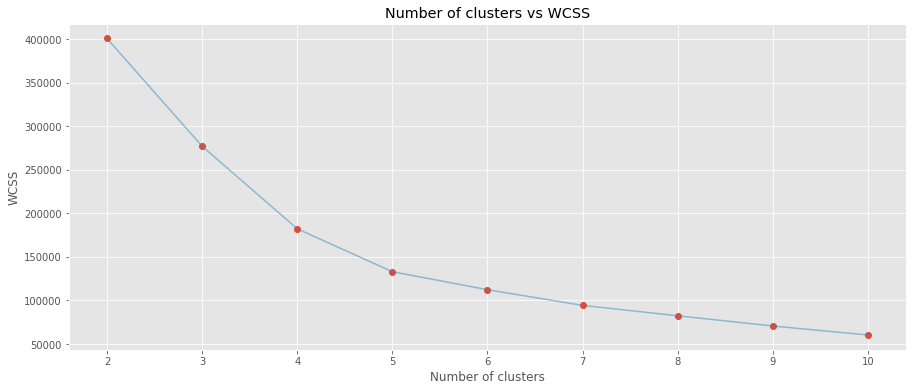

In [21]:
C1 = df[['pizza','location']].to_numpy()

wcss_c1 = []
# Let's test different number of k
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    model.fit(C1)
    wcss_c1.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_c1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_c1 , '-' , alpha = 0.5)
plt.xlabel('Number of clusters') , plt.ylabel('WCSS')
plt.title('Number of clusters vs WCSS')
plt.show()

In [22]:
model_seg3 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

model_seg3.fit(C1)

labels3 = model_seg3.labels_

centroids3 = model_seg3.cluster_centers_

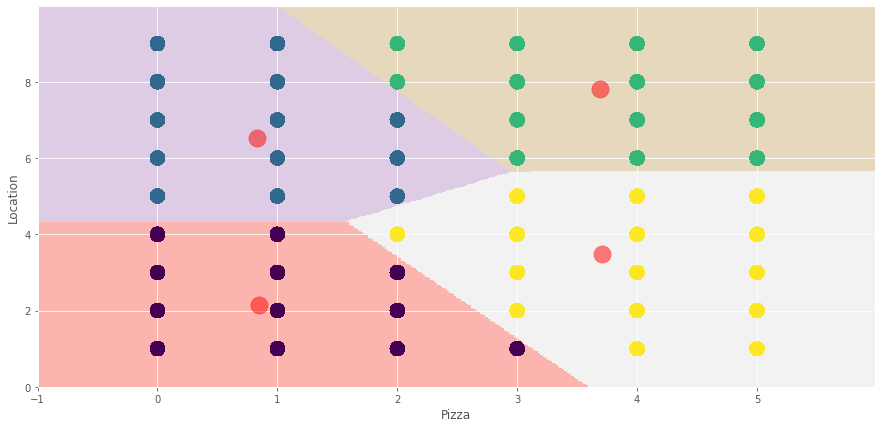

In [23]:
# Plot

# Meshgrid
h = 0.02
x_min, x_max = C1[:, 0].min() - 1, C1[:, 0].max() + 1
y_min, y_max = C1[:, 1].min() - 1, C1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg3.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel1, 
           aspect = 'auto', 
           origin = 'lower')

# Plot 
plt.scatter( x = 'pizza', y = 'location', data = df, c = labels3, s = 200 )
plt.scatter(x = centroids3[: , 0], y =  centroids3[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Location')
plt.show()

### Segmentation 4

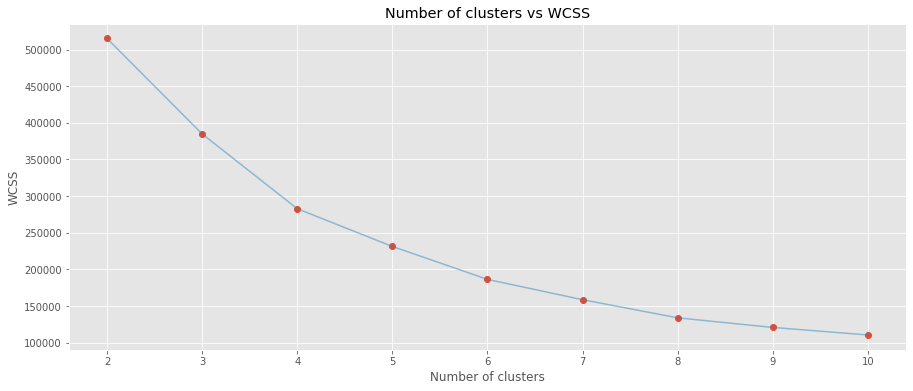

In [24]:
C1 = df[['pizza','salad','location']].to_numpy()

wcss_c1 = []
# Let's test different number of k
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    model.fit(C1)
    wcss_c1.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_c1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_c1 , '-' , alpha = 0.5)
plt.xlabel('Number of clusters') , plt.ylabel('WCSS')
plt.title('Number of clusters vs WCSS')
plt.show()

In [25]:
model_seg4 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

model_seg4.fit(C1)
labels4 = model_seg4.labels_
centroids4 = model_seg4.cluster_centers_

In [26]:
# Plotly
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

In [27]:
# Plot

graph = go.Scatter3d(x = df['pizza'], 
                       y = df['salad'], 
                       z = df['location'], 
                       mode = 'markers', 
                       marker = dict(color = labels4, 
                                     size = 4,
                                     line = dict(color = labels4, width = 15),
                                     opacity = 0.7))

layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salad'),
                                zaxis = dict(title  = 'Location')))

fig = go.Figure(data = graph, layout = layout)
py.offline.iplot(fig)

### Segmentation 5

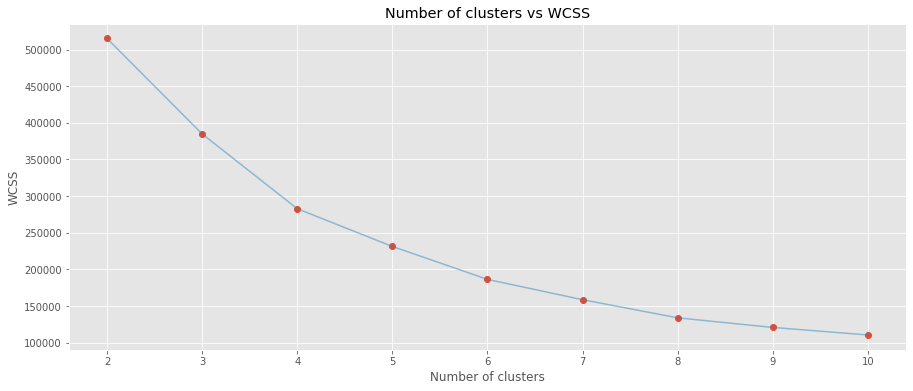

In [28]:
C1 = df[['pizza','salad','location']].to_numpy()

wcss_c1 = []
# Let's test different number of k
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    model.fit(C1)
    wcss_c1.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_c1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_c1 , '-' , alpha = 0.5)
plt.xlabel('Number of clusters') , plt.ylabel('WCSS')
plt.title('Number of clusters vs WCSS')
plt.show()

In [29]:
model_seg5 = (KMeans(n_clusters = 2,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

model_seg5.fit(C1)
labels5 = model_seg5.labels_
centroids5 = model_seg5.cluster_centers_

In [30]:
# Plot
graph = go.Scatter3d(x = df['pizza'], 
                       y = df['salad'], 
                       z = df['dessert'], 
                       mode = 'markers', 
                       marker = dict(color = labels5, 
                                     size = 4,
                                     line = dict(color = labels5, width = 15),
                                     opacity = 0.7))

layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salad'),
                                zaxis = dict(title  = 'Dessert')))

fig = go.Figure(data = graph, layout = layout)
py.offline.iplot(fig)